# NUWE Schnider Hackaton - Data Science - Zero deforestation mission
## Team name: ZeroOne
#### Members:
- Sai Thejeshwar
- Abhay Joshi


#### This notebook contains the code for all the final model built

### Import Required libraries

In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import PIL
from fastai.vision.all import *
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [5]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [6]:
%cd /gdrive/My Drive/Deforestation

/gdrive/My Drive/Deforestation


In [7]:
train = pd.read_csv('train.csv')
test =pd.read_csv('test.csv')

### Data Unbalance Visualization

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


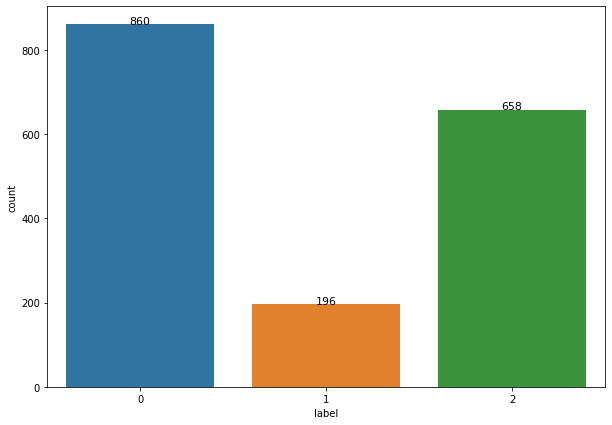

In [8]:
countplt, ax = plt.subplots(figsize = (10,7))
ax = sns.countplot(train['label']);

for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width()  / 2,rect.get_height()+ 0.75,rect.get_height(),horizontalalignment='center', fontsize = 11)

### Data preparation

In [56]:
from sklearn.model_selection import train_test_split
train_df, validate_df = train_test_split(train, test_size=0.1)

In [48]:
Xtrain=train.iloc[:,1:-2]
ytrain=train.iloc[:,0]

Xtest=test.iloc[:,0:-2]

In [49]:
df = pd.DataFrame([train["example_path"], train["label"]]).transpose()

### SVM Model creation

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn import svm

param_grid={'gamma':[0.01, 0.03, 0.1, 0.3, 1, 3, 10, 30, 100],'C': [0.01, 0.03, 0.1, 0.3, 1, 3, 10, 30, 100]}
clasificadores = GridSearchCV(svm.SVC(kernel='rbf'), param_grid,cv=10,scoring="f1_macro",verbose=2)
clasificadores.fit(Xtrain,ytrain)


### Loading of models and execution of predictions in train for the ensemble.

In [12]:
predicciones=clasificadores.predict(Xtrain)

from sklearn.metrics import f1_score
f1_score(ytrain, predicciones, average='macro')

0.7470028086725251

In [50]:
prediccionesSVC=clasificadores.predict(Xtrain)

#Resnet34
learnerR34=load_learner("model/resnet34.pkl", cpu=False)
prediccionesR34=[]
#Resnet50
learnerR50=load_learner("model/resnet50.pkl", cpu=False)
prediccionesR50=[]
#Densenet121
learnerD121=load_learner("model/densenet121.pkl", cpu=False)
prediccionesD121=[]
#Vgg_16_bn
learnerV16=load_learner("model/vgg16_bn.pkl", cpu=False)
prediccionesV16=[]

In [14]:
from fastprogress.fastprogress import progress_bar
for i in progress_bar(range(Xtrain.shape[0])):
  prediccionesR34.append(learnerR34.predict(df.iloc[i,0])[0])
  prediccionesR50.append(learnerR50.predict(df.iloc[i,0])[0])
  prediccionesD121.append(learnerD121.predict(df.iloc[i,0])[0])
  prediccionesV16.append(learnerV16.predict(df.iloc[i,0])[0])

In [15]:
Results=pd.DataFrame(data={"SVC":prediccionesSVC,"Resnet34":pd.to_numeric(prediccionesR34),"Resnet50":pd.to_numeric(prediccionesR50),"Densenet121":pd.to_numeric(prediccionesD121),"Vgg_16_bn":pd.to_numeric(prediccionesV16)})

### Creation of the ensemble

In [35]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
ensemble=KNeighborsClassifier()
ensemble.fit(Results,ytrain)

KNeighborsClassifier()

In [17]:
predictTrain=ensemble.predict(Results)
f1_score(ytrain, predictTrain, average='macro')

0.9568663279183666

In [33]:
clr = metrics.classification_report(ytrain, predictTrain)
print("Classification Report:\n----------------------\n", clr)

Classification Report:
----------------------
               precision    recall  f1-score   support

           0       0.97      0.99      0.98       860
           1       0.96      0.90      0.93       196
           2       0.97      0.96      0.96       658

    accuracy                           0.97      1714
   macro avg       0.97      0.95      0.96      1714
weighted avg       0.97      0.97      0.97      1714



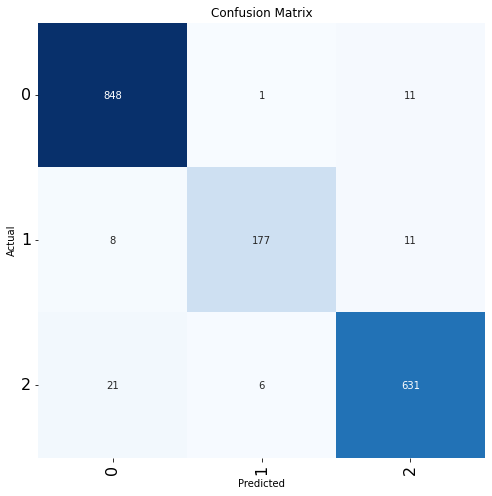

In [34]:
cm = metrics.confusion_matrix(ytrain, predictTrain)       
length=3
if length<8:
    fig_width=8
    fig_height=8
else:
    fig_width= int(length * .5)
    fig_height= int(length * .5)
plt.figure(figsize=(fig_width, fig_height))
sns.heatmap(cm, annot=True, vmin=0, fmt="g", cmap="Blues", cbar=False)       
plt.xticks(np.arange(length)+.5, [0,1,2], rotation= 90, fontsize=16)
plt.yticks(np.arange(length)+.5,[0,1,2], rotation=0, fontsize=16)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

In [59]:
Xtrain = train_df.iloc[:,1:-2]
ytrain = train_df.iloc[:,0]

Xval = validate_df.iloc[:,1:-2]
yval = validate_df.iloc[:,0]

Xtest=test.iloc[:,0:-2]
df = pd.DataFrame([validate_df["example_path"], validate_df["label"]]).transpose()

In [62]:
prediccionesSVC=clasificadores.predict(Xval)
#VGG16
learnerV16=load_learner("model/vgg16_bn.pkl", cpu=False)
prediccionesV16=[]
#Resnet34
learnerR34=load_learner("model/resnet34.pkl", cpu=False)
prediccionesR34=[]
#Resnet50
learnerR50=load_learner("model/resnet50.pkl", cpu=False)
prediccionesR50=[]
#Densenet121
learnerD121=load_learner("model/densenet121.pkl", cpu=False)
prediccionesD121=[]

In [63]:
from fastprogress.fastprogress import progress_bar
for i in progress_bar(range(Xval.shape[0])):
  prediccionesR34.append(learnerR34.predict(df.iloc[i,0])[0])
  prediccionesR50.append(learnerR50.predict(df.iloc[i,0])[0])
  prediccionesD121.append(learnerD121.predict(df.iloc[i,0])[0])
  prediccionesV16.append(learnerV16.predict(df.iloc[i,0])[0])

In [64]:
results_val=pd.DataFrame(data={"SVC":prediccionesSVC,"Resnet34":pd.to_numeric(prediccionesR34),"Resnet50":pd.to_numeric(prediccionesR50),"Densenet121":pd.to_numeric(prediccionesD121),"Vgg_16_bn":pd.to_numeric(prediccionesV16)})

In [65]:
predictval=ensemble.predict(results_val)
f1_score(yval, predictval, average='macro')

0.9546931198514909

In [66]:
clr = metrics.classification_report(yval, predictval)
print("Classification Report:\n----------------------\n", clr)

Classification Report:
----------------------
               precision    recall  f1-score   support

           0       0.94      1.00      0.97        82
           1       1.00      0.86      0.92        21
           2       0.99      0.96      0.97        69

    accuracy                           0.97       172
   macro avg       0.98      0.94      0.95       172
weighted avg       0.97      0.97      0.96       172



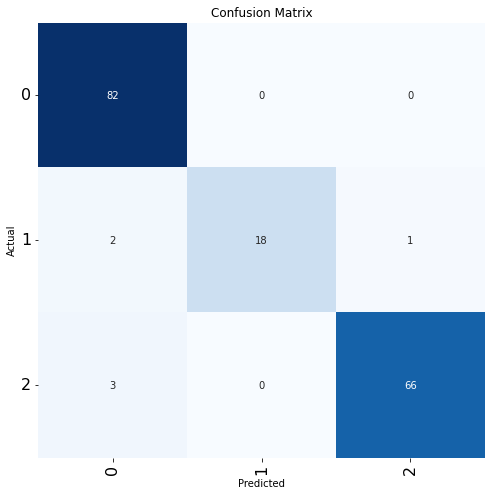

In [68]:
cm = metrics.confusion_matrix(yval, predictval)       
length=3
if length<8:
    fig_width=8
    fig_height=8
else:
    fig_width= int(length * .5)
    fig_height= int(length * .5)
plt.figure(figsize=(fig_width, fig_height))
sns.heatmap(cm, annot=True, vmin=0, fmt="g", cmap="Blues", cbar=False)       
plt.xticks(np.arange(length)+.5, [0,1,2], rotation= 90, fontsize=16)
plt.yticks(np.arange(length)+.5,[0,1,2], rotation=0, fontsize=16)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

### Obtaining test results

In [18]:
prediccionesSVC=clasificadores.predict(Xtest)
#Resnet34
prediccionesR34=[]
#Resnet50
prediccionesR50=[]
#Densenet121
prediccionesD121=[]
#Vgg_16_bn
prediccionesV16=[]

In [19]:
dfTest = pd.DataFrame([test["example_path"]]).transpose()

In [20]:
from fastprogress.fastprogress import progress_bar
for i in progress_bar(range(dfTest.shape[0])):
  prediccionesR34.append(learnerR34.predict(dfTest.iloc[i,0])[0])
  prediccionesR50.append(learnerR50.predict(dfTest.iloc[i,0])[0])
  prediccionesD121.append(learnerD121.predict(dfTest.iloc[i,0])[0])
  prediccionesV16.append(learnerV16.predict(dfTest.iloc[i,0])[0])

In [21]:
ResultsTest=pd.DataFrame(data={"SVC":prediccionesSVC,"Resnet34":pd.to_numeric(prediccionesR34),"Resnet50":pd.to_numeric(prediccionesR50),"Densenet121":pd.to_numeric(prediccionesD121),"Vgg_16_bn":pd.to_numeric(prediccionesV16)})

In [22]:
predictTest=ensemble.predict(ResultsTest)
predictTest

array([2, 2, 0, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 0, 2, 0, 1, 0, 0, 0, 2, 0,
       1, 0, 1, 1, 2, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 2, 2, 0, 0, 0,
       2, 0, 0, 0, 0, 0, 0, 1, 2, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 2, 0, 2,
       2, 0, 0, 2, 2, 2, 2, 0, 2, 0, 2, 0, 2, 0, 2, 2, 2, 0, 2, 0, 1, 2,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 2, 2, 0, 2, 2, 1, 0,
       0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 1, 2, 2, 2, 0, 0,
       0, 1, 0, 2, 1, 0, 0, 1, 2, 2, 1, 0, 0, 2, 1, 0, 0, 0, 0, 2, 0, 2,
       0, 2, 1, 2, 2, 0, 2, 2, 0, 0, 0, 1, 0, 0, 2, 0, 2, 0, 0, 2, 0, 2,
       2, 0, 2, 0, 0, 0, 2, 1, 2, 1, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 2, 0,
       0, 0, 1, 0, 1, 1, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0,
       0, 0, 2, 0, 2, 0, 0, 2, 1, 2, 0, 2, 2, 0, 2, 2, 1, 0, 0, 2, 0, 1,
       2, 0, 0, 0, 0, 0, 0, 2, 0, 1, 2, 0, 0, 0, 2, 2, 0, 2, 2, 2, 0, 0,
       0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2,
       2, 2, 0, 0, 2, 2, 0, 2, 0, 1, 0, 2, 2, 2, 0,

In [23]:
indx=[]
for i in range(Xtest.shape[0]): 
  numberImg=dfTest.iloc[i,0].split("/")[-1].split(".")[0]
  indx.append(int(numberImg))

In [24]:
yTest=pd.DataFrame(data={'target':predictTest},index=indx)
yTest=yTest.sort_index()
yTest

,target
1,2
4,1
6,0
9,1
15,0
...,...
2341,0
2342,0
2345,2
2347,2


In [25]:
yTest.to_csv("predictions.csv")

In [26]:
yTest.to_json("predictions.json")